In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio

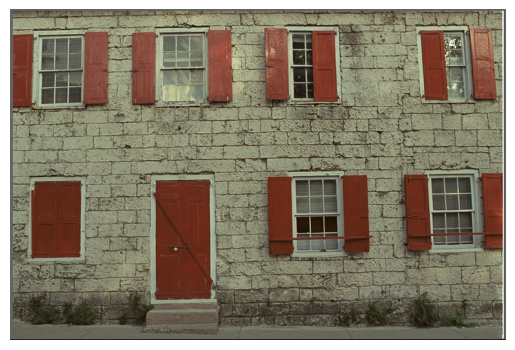

In [85]:
def load_and_display_image(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()
    return image

image_path = "C:\labsCV\lab3\kodim01.png"  
image = load_and_display_image(image_path)

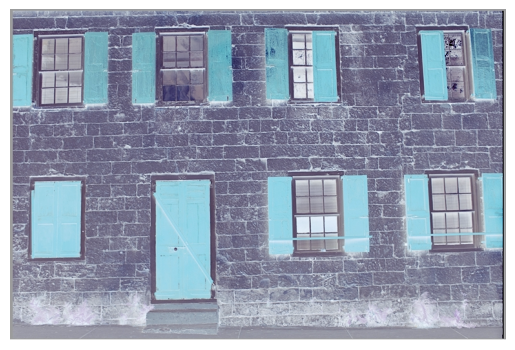

In [86]:
def invert_image(image):
    inverted_image = cv2.bitwise_not(image)
    inverted_image_rgb = cv2.cvtColor(inverted_image, cv2.COLOR_BGR2RGB)
    plt.imshow(inverted_image_rgb)
    plt.axis('off')
    plt.show()
    return inverted_image

inverted_image = invert_image(image)

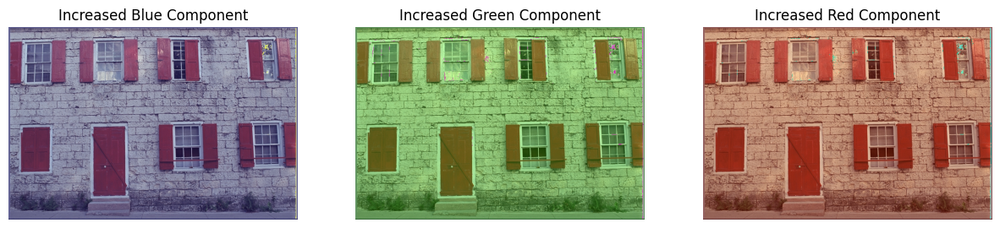

In [93]:
def modify_rgb_components(image):
    blue_image = image.copy()
    green_image = image.copy()
    red_image = image.copy()

    blue_image[:, :, 0] = np.clip(blue_image[:, :, 0] + 50, 0, 255)
    green_image[:, :, 1] = np.clip(green_image[:, :, 1] + 50, 0, 255)
    red_image[:, :, 2] = np.clip(red_image[:, :, 2] + 50, 0, 255)

    add_blue_image_rgb = cv2.cvtColor(blue_image, cv2.COLOR_BGR2RGB)
    add_green_image_rgb = cv2.cvtColor(green_image, cv2.COLOR_BGR2RGB)
    add_red_image_rgb = cv2.cvtColor(red_image, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(add_blue_image_rgb)
    axs[0].set_title("Increased Blue Component")
    axs[0].axis('off')

    axs[1].imshow(add_green_image_rgb)
    axs[1].set_title("Increased Green Component")
    axs[1].axis('off')

    axs[2].imshow(add_red_image_rgb)
    axs[2].set_title("Increased Red Component")
    axs[2].axis('off')

    plt.show()

modify_rgb_components(image)

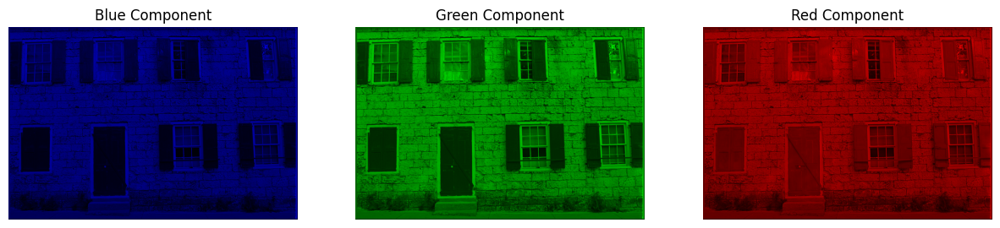

In [94]:
def show_rgb_collage(image):
    blue_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    red_channel = image[:, :, 2]

    blue_image = np.zeros_like(image)
    green_image = np.zeros_like(image)
    red_image = np.zeros_like(image)
    
    blue_image[:, :, 0] = blue_channel  
    green_image[:, :, 1] = green_channel  
    red_image[:, :, 2] = red_channel  

    blue_image_rgb = cv2.cvtColor(blue_image, cv2.COLOR_BGR2RGB)
    green_image_rgb = cv2.cvtColor(green_image, cv2.COLOR_BGR2RGB)
    red_image_rgb = cv2.cvtColor(red_image, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(blue_image_rgb)
    axs[0].set_title("Blue Component")
    axs[0].axis('off')

    axs[1].imshow(green_image_rgb)
    axs[1].set_title("Green Component")
    axs[1].axis('off')

    axs[2].imshow(red_image_rgb)
    axs[2].set_title("Red Component")
    axs[2].axis('off')

    plt.show()

show_rgb_collage(image)


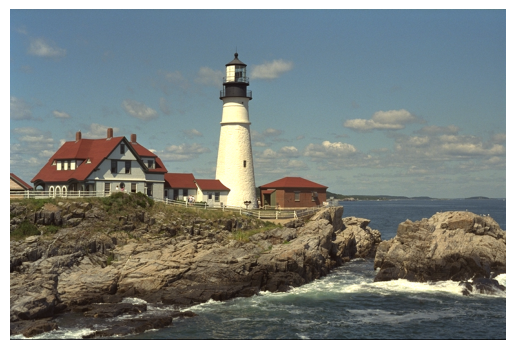

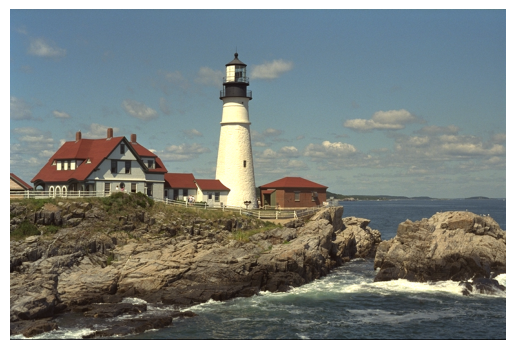

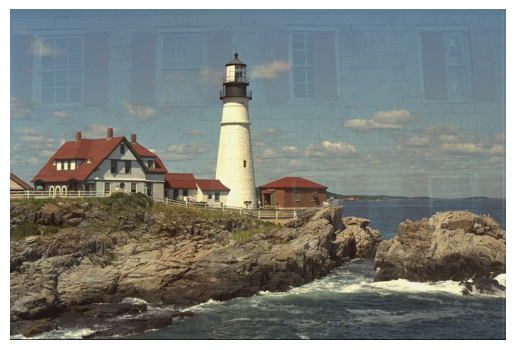

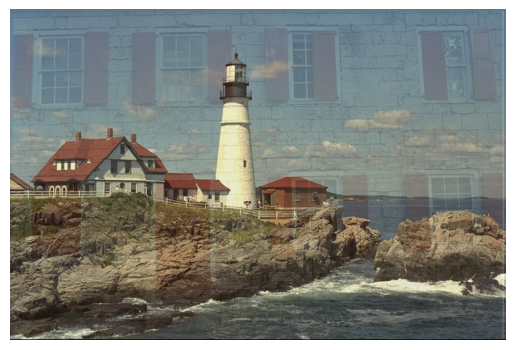

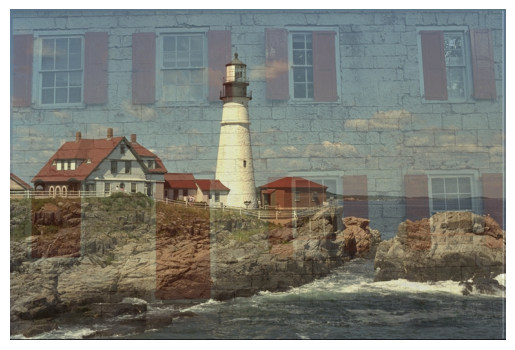

...

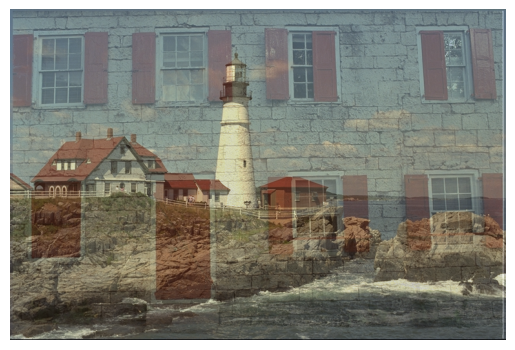

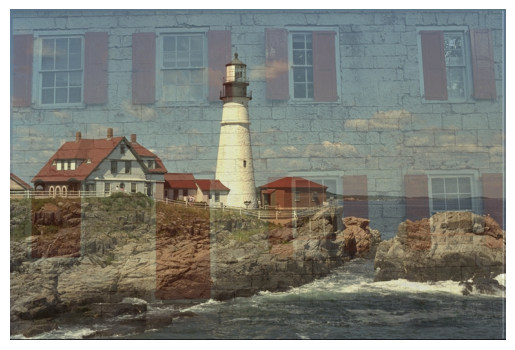

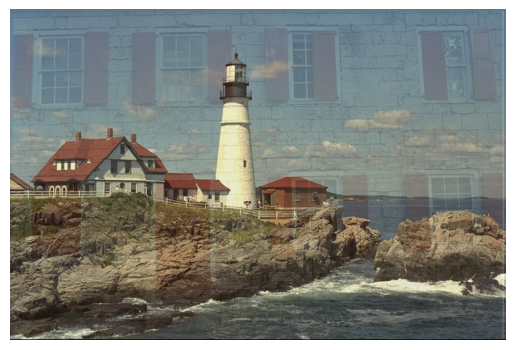

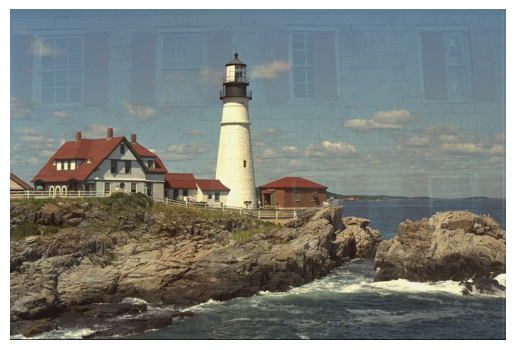

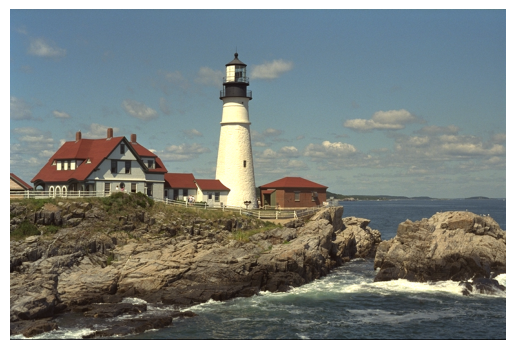

In [89]:
def merge_images(image1, image2, alpha):
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    merged_image = cv2.addWeighted(image1, alpha, image2, 1 - alpha, 0)
    plt.imshow(merged_image)
    plt.axis('off')
    plt.show()
    return merged_image

def create_gif(image1, image2, output_path, steps=10):
    images = []
    
    for step in range(steps + 1):
        alpha = step / steps
        merged_image = merge_images(image1, image2, alpha)
        images.append(merged_image)

    for step in range(steps + 1):
        alpha = 1 - (step / steps)
        merged_image = merge_images(image1, image2, alpha)
        images.append(merged_image)
   
    imageio.mimsave(output_path, images, duration=0.1)

image2 = load_and_display_image("C:\labsCV\lab3\kodim21.png") 
output_gif_path = "C:/labsCV/lab3/merged_animation.gif"
create_gif(image, image2, output_gif_path)

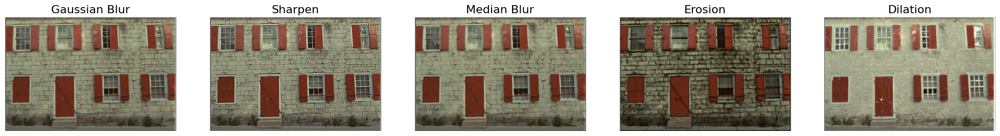

In [90]:
def apply_filter(image, filter_type):
    if filter_type == 'blur':
        filtered_image = cv2.GaussianBlur(image, (5, 5), 0)
    elif filter_type == 'sharpen':
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
        filtered_image = cv2.filter2D(image, -1, kernel)
    elif filter_type == 'median':
        filtered_image = cv2.medianBlur(image, 5)
    elif filter_type == 'erosion':
        kernel = np.ones((5, 5), np.uint8)
        filtered_image = cv2.erode(image, kernel, iterations=1)
    elif filter_type == 'dilation':
        kernel = np.ones((5, 5), np.uint8)
        filtered_image = cv2.dilate(image, kernel, iterations=1)
    else:
        raise ValueError(f"Unsupported filter type: {filter_type}")
    
    return filtered_image

def show_filter_collage(image):
    filters = ['blur', 'sharpen', 'median', 'erosion', 'dilation']
    titles = ['Gaussian Blur', 'Sharpen', 'Median Blur', 'Erosion', 'Dilation']

    fig, axs = plt.subplots(1, 5, figsize=(25, 10))

    for i, filter_type in enumerate(filters):
        filtered_image = apply_filter(image, filter_type)
        filtered_image_rgb = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB)
        axs[i].imshow(filtered_image_rgb)
        axs[i].set_title(titles[i], fontsize=16)
        axs[i].axis('off')

    plt.show()

show_filter_collage(image)

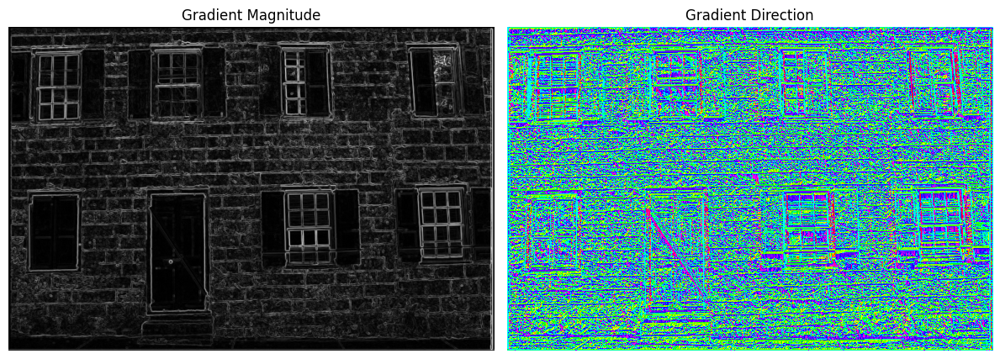

In [95]:
def calculate_sobel_gradients(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) / 255.0
    
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3) 
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)  
    
    gradient = np.sqrt(sobel_x**2 + sobel_y**2)
    
    gradient_direction = np.arctan2(sobel_y, sobel_x)
    
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(gradient, cmap='gray')
    plt.title('Gradient Magnitude')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gradient_direction, cmap='hsv')
    plt.title('Gradient Direction')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

calculate_sobel_gradients(image)    

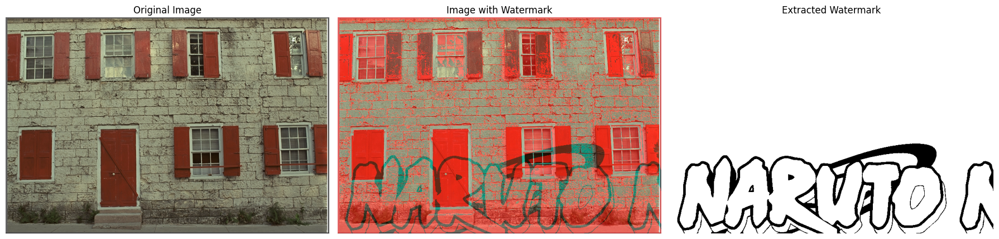

In [96]:
def embed_watermark(img, watermark, bit_plane=1):
    image = img.copy()
    
    if len(watermark.shape) != 2:
        raise ValueError("Watermark should be grayscale")

    wm_resized = np.tile(watermark, (int(np.ceil(image.shape[0] / watermark.shape[0])), 
                                     int(np.ceil(image.shape[1] / watermark.shape[1]))))
    wm_resized = wm_resized[:image.shape[0], :image.shape[1]]

    if bit_plane < 1 or bit_plane > 8:
        raise ValueError("Номер бітової площини має бути від 1 до 8.")
    
    blue_channel = image[:, :, 2].copy()  
    mask = 1 << (bit_plane - 1)

    blue_channel = np.bitwise_and(blue_channel, 255 - mask)  
    watermark_bin = (wm_resized > 128).astype(np.uint8)

    blue_channel = np.bitwise_or(blue_channel, watermark_bin * mask)
    image[:, :, 2] = blue_channel

    return image

def extract_watermark(img_with_watermark, bit_plane=1):
    if bit_plane < 1 or bit_plane > 8:
        raise ValueError("Номер бітової площини має бути від 1 до 8.")
    
    blue_channel = img_with_watermark[:, :, 2].copy()
    mask = 1 << (bit_plane - 1)

    extracted_watermark = (np.bitwise_and(blue_channel, mask) > 0).astype(np.uint8) * 255

    return extracted_watermark

def show_collage(original_image, image_with_watermark, extracted_watermark):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    axs[1].imshow(cv2.cvtColor(image_with_watermark, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Image with Watermark')
    axs[1].axis('off')

    axs[2].imshow(extracted_watermark, cmap='gray')
    axs[2].set_title('Extracted Watermark')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

watermark_image_path = "C:/labsCV/lab3/967a94f51f1ec79c5b86c40b4bca257f.jpg"  

watermark_image = cv2.imread(watermark_image_path, cv2.IMREAD_GRAYSCALE)

bit_plane = 8  
image_with_watermark = embed_watermark(image, watermark_image, bit_plane)

extracted_watermark = extract_watermark(image_with_watermark, bit_plane)

show_collage(image, image_with_watermark, extracted_watermark)
